In [1]:
#Importing libraies
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import pandas as pd 
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

In [2]:
from sklearn import metrics

In [3]:
from IPython.display import HTML
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

In [4]:
calories = pd.read_csv("calories.csv")
exercise = pd.read_csv("exercise.csv")

## General Overview of Dataset

In [6]:
calories.head()

,User_ID,Calories
0,14733363,231
1,14861698,66
2,11179863,26
3,16180408,71
4,17771927,35


In [7]:
exercise.head()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8


In [8]:
exercise_df = exercise.merge(calories , on = "User_ID")
exercise_df.head()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8,231
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3,66
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7,26
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5,71
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8,35


In [9]:
print("This dataset has " , exercise_df.shape[0] , "instances and ", exercise_df.shape[1] , "columns.") 

This dataset has  15000 instances and  9 columns.


In [10]:
print("Columns : ")
for i , column in zip(range(len(exercise_df.columns)),exercise_df.columns):
  print ("\t", i+1 , ".",  column)

Columns : 
	 1 . User_ID
	 2 . Gender
	 3 . Age
	 4 . Height
	 5 . Weight
	 6 . Duration
	 7 . Heart_Rate
	 8 . Body_Temp
	 9 . Calories


Dataset's Overall Statistic

In [12]:
exercise_df.loc[:,:]

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8,231
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3,66
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7,26
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5,71
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8,35
...,...,...,...,...,...,...,...,...,...
14995,15644082,female,20,193.0,86.0,11.0,92.0,40.4,45
14996,17212577,female,27,165.0,65.0,6.0,85.0,39.2,23
14997,17271188,female,43,159.0,58.0,16.0,90.0,40.1,75
14998,18643037,male,78,193.0,97.0,2.0,84.0,38.3,11


In [13]:
exercise_df.iloc[:,1:].describe()

,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,42.789800,174.465133,74.966867,15.530600,95.518533,40.025453,89.539533
std,16.980264,14.258114,15.035657,8.319203,9.583328,0.779230,62.456978
min,20.000000,123.000000,36.000000,1.000000,67.000000,37.100000,1.000000
25%,28.000000,164.000000,63.000000,8.000000,88.000000,39.600000,35.000000
50%,39.000000,175.000000,74.000000,16.000000,96.000000,40.200000,79.000000
75%,56.000000,185.000000,87.000000,23.000000,103.000000,40.600000,138.000000
max,79.000000,222.000000,132.000000,30.000000,128.000000,41.500000,314.000000


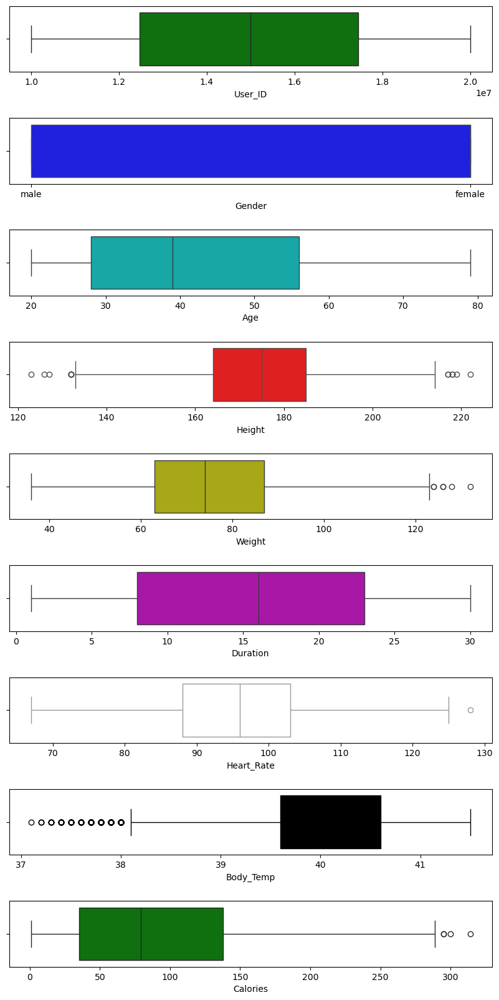

In [14]:
c = ['g' , 'b' , 'c' , 'r' , 'y' , 'm' , 'w' , 'k' , 'g' ]
fig1 , axes = plt.subplots(len(exercise_df.columns) , 1 , figsize = (10,20))
plt.subplots_adjust(wspace = 0.3 , hspace = 0.7 )
axes = axes.flatten()
for i , column in zip(range(len(exercise_df.columns)) , exercise_df.columns ):
  try :
    sns.boxplot(data = exercise_df , x = column , color = c[i] , ax = axes[i])
  except :
    fig1.delaxes(axes[i])
    continue

OVERALL INFORMATION OF DATASET

In [16]:
exercise_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User_ID     15000 non-null  int64  
 1   Gender      15000 non-null  object 
 2   Age         15000 non-null  int64  
 3   Height      15000 non-null  float64
 4   Weight      15000 non-null  float64
 5   Duration    15000 non-null  float64
 6   Heart_Rate  15000 non-null  float64
 7   Body_Temp   15000 non-null  float64
 8   Calories    15000 non-null  int64  
dtypes: float64(5), int64(3), object(1)
memory usage: 1.0+ MB


Null Values





In [18]:
exercise_df.isnull()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
14995,False,False,False,False,False,False,False,False,False
14996,False,False,False,False,False,False,False,False,False
14997,False,False,False,False,False,False,False,False,False
14998,False,False,False,False,False,False,False,False,False


<Axes: >

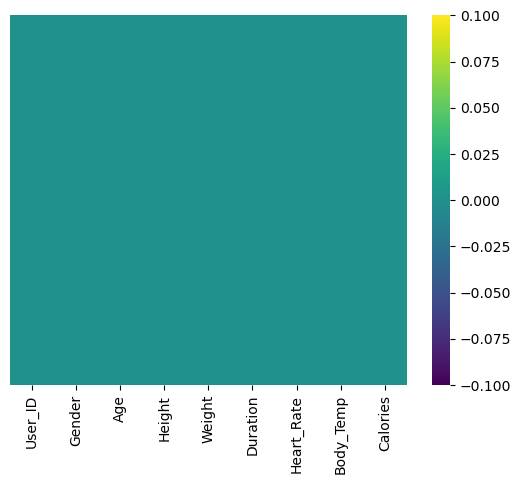

In [19]:
sns.heatmap(exercise_df.isnull() , yticklabels = False , cbar = True , cmap = 'viridis')

DROP Duplicates

In [21]:
print("The  shape of dataset before dropping duplicates : " , exercise_df.shape)
exercise_df.drop_duplicates(subset = ['User_ID'], keep = 'last' , inplace = True)
print("The shape of dataset after dropping duplicates : ", exercise_df.shape)

The  shape of dataset before dropping duplicates :  (15000, 9)
The shape of dataset after dropping duplicates :  (15000, 9)


In [22]:
exercise_df

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8,231
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3,66
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7,26
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5,71
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8,35
...,...,...,...,...,...,...,...,...,...
14995,15644082,female,20,193.0,86.0,11.0,92.0,40.4,45
14996,17212577,female,27,165.0,65.0,6.0,85.0,39.2,23
14997,17271188,female,43,159.0,58.0,16.0,90.0,40.1,75
14998,18643037,male,78,193.0,97.0,2.0,84.0,38.3,11


In [23]:
exercise_df.drop(columns = "User_ID" , inplace = True)
exercise_df

,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,male,68,190.0,94.0,29.0,105.0,40.8,231
1,female,20,166.0,60.0,14.0,94.0,40.3,66
2,male,69,179.0,79.0,5.0,88.0,38.7,26
3,female,34,179.0,71.0,13.0,100.0,40.5,71
4,female,27,154.0,58.0,10.0,81.0,39.8,35
...,...,...,...,...,...,...,...,...
14995,female,20,193.0,86.0,11.0,92.0,40.4,45
14996,female,27,165.0,65.0,6.0,85.0,39.2,23
14997,female,43,159.0,58.0,16.0,90.0,40.1,75
14998,male,78,193.0,97.0,2.0,84.0,38.3,11


In [24]:
exercise_train_data , exercise_test_data = train_test_split(exercise_df , test_size = 0.2 , random_state = 1)
print("Shape of training data : " , exercise_train_data.shape)
print("Shape of test data : " , exercise_test_data.shape)

Shape of training data :  (12000, 8)
Shape of test data :  (3000, 8)


In [25]:
from  matplotlib import style
style.use("bmh")

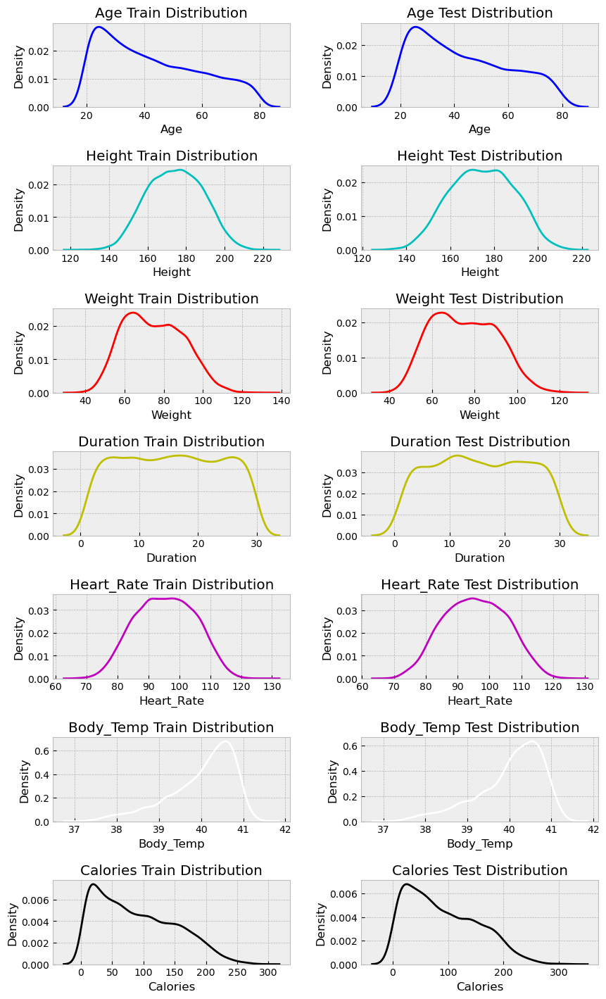

In [26]:

# Color list
c = ['g', 'b', 'c', 'r', 'y', 'm', 'w', 'k', 'g']

# Create subplot
fig1, axes = plt.subplots(len(exercise_train_data.columns), 2, figsize=(10, 20))
plt.subplots_adjust(wspace=0.3, hspace=0.7)
axes = axes.flatten()

# Loop for Train Data
for i, (column, color) in enumerate(zip(exercise_train_data.columns, c)):
    try:
        axes[i * 2].set_title(column + " Train Distribution")
        sns.kdeplot(data=exercise_train_data, x=column, color=color, ax=axes[i * 2])
    except:
        fig1.delaxes(axes[i * 2])
        continue

# Loop for Test Data
for i, (column, color) in enumerate(zip(exercise_test_data.columns, c)):
    try:
        axes[i * 2 + 1].set_title(column + " Test Distribution")
        sns.kdeplot(data=exercise_test_data, x=column, color=color, ax=axes[i * 2 + 1])
    except:
        fig1.delaxes(axes[i * 2 + 1])
        continue



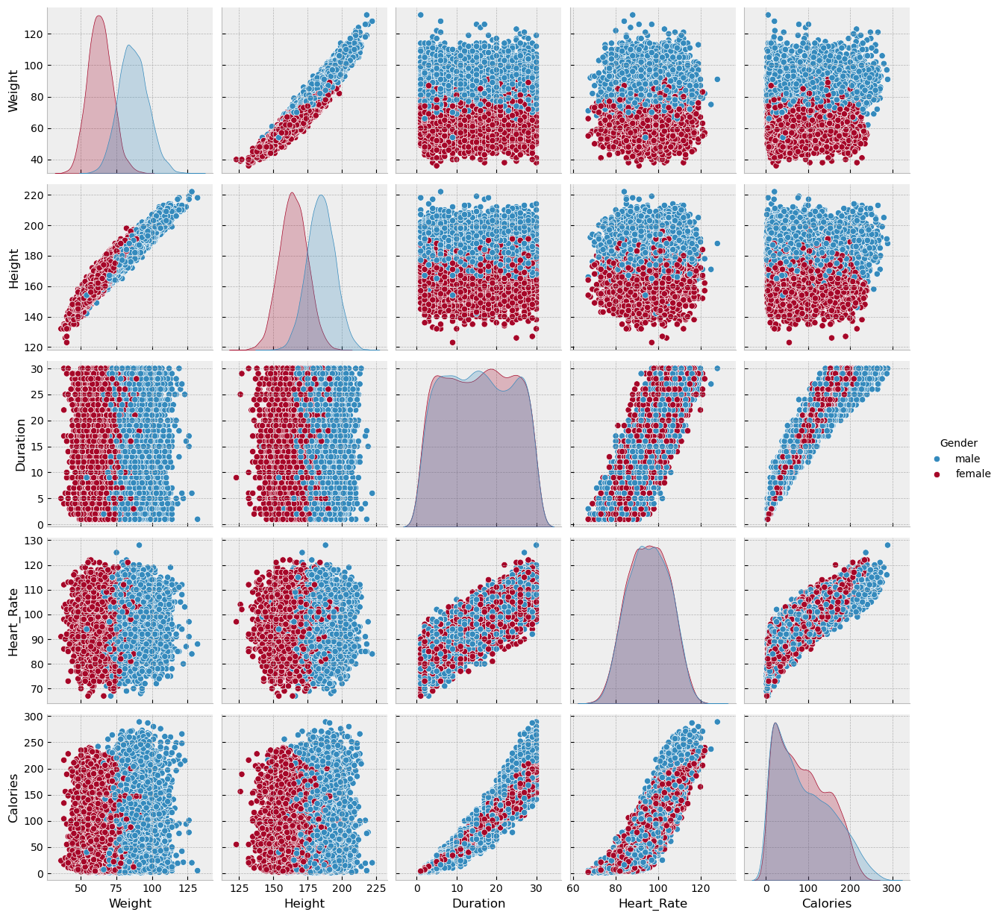

In [81]:
sns.pairplot(exercise_train_data[["Weight" , "Height" , "Duration" , "Heart_Rate" , "Calories" , "Gender"]] , hue = "Gender")

Exploratory Data Analysis(EDA)

In [29]:
print("Minimum age in dataset is : " , exercise_train_data["Age"].min())
print("Maximum age in dataset is : " , exercise_train_data["Age"].max())

Minimum age in dataset is :  20
Maximum age in dataset is :  79


In [30]:
age_groups = ["Young" , "Middle-Aged" , "Old" ]
exercise_train_data["age_groups"] = pd.cut( exercise_train_data["Age"] , bins = [20 , 40 , 60, 80] , right = False , labels = age_groups)
exercise_train_data["age_groups"].head()

2643             Old
13352            Old
13117            Old
2560             Old
14297    Middle-Aged
Name: age_groups, dtype: category
Categories (3, object): ['Young' < 'Middle-Aged' < 'Old']

In [31]:
exercise_train_data["age_groups"].value_counts()

age_groups
Young          6029
Middle-Aged    3535
Old            2436
Name: count, dtype: int64

<Axes: xlabel='age_groups', ylabel='count'>

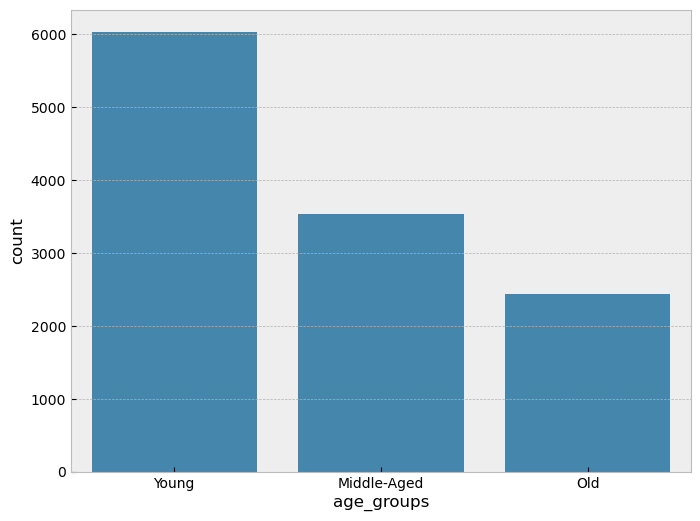

In [32]:
plt.rcParams['figure.figsize'] = 8, 6
sns.countplot(data = exercise_train_data , x = "age_groups")

In [33]:
fig = px.box(exercise_train_data , x = "age_groups" , y = "Calories"  , color = "Gender")

fig.update_layout(
    width  = 700,
    height = 450,
)

fig.show()

In [34]:
fig = px.box(exercise_train_data , x = "age_groups" , y = "Duration"  , color = "Gender")

fig.update_layout(
    width  = 800,
    height = 450,
)

fig.show() 

<Axes: xlabel='Gender', ylabel='count'>

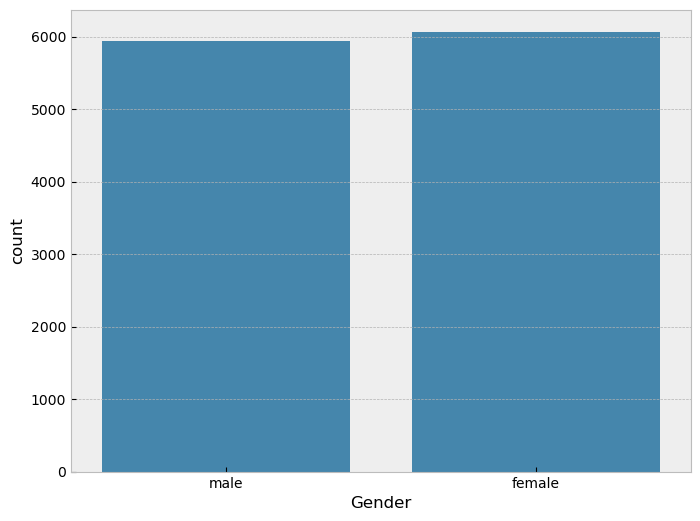

In [35]:
plt.rcParams['figure.figsize'] = 8, 6
sns.countplot(data = exercise_train_data , x = "Gender")

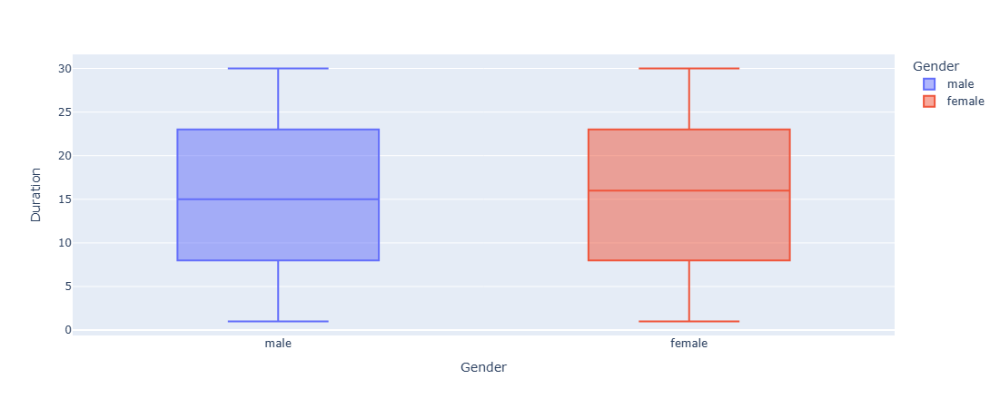

In [36]:
fig = px.box(exercise_train_data , x = "Gender" , y = "Duration"  , color = "Gender")

fig.update_layout(
    width  = 800,
    height = 450,
)

fig.show() 

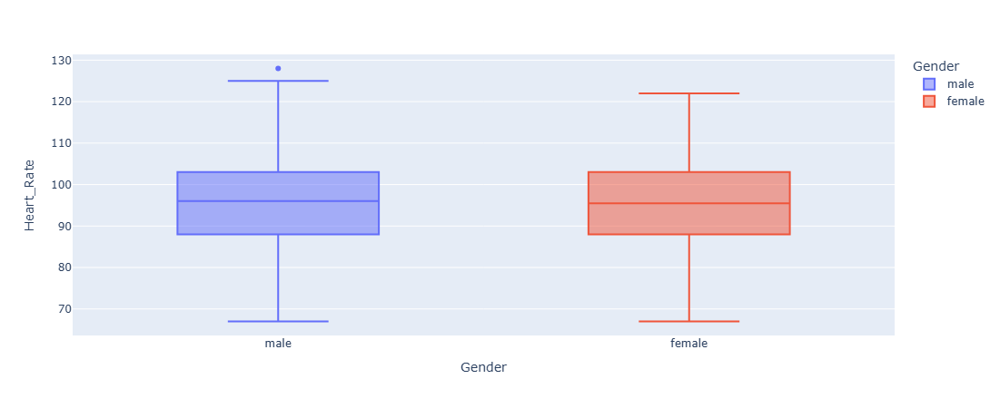

In [37]:
fig = px.box(exercise_train_data , x = "Gender" , y = "Heart_Rate"  , color = "Gender")

fig.update_layout(
    width  = 800,
    height = 450,
)

fig.show() 


In this section our purpose is combine the `Weight` column and the `Height` column values to perform a simple BMI calculation to classify individuals 
of this dataset into different groups according to their BMI value.
* The BMI(Body Mass Index) formula:

$BMI = \frac{Weight(kg)}{Height(m)^2}$

OR

$BMI = \frac{Weight(Ib)}{Height(in)^2}$


* The first formula will be used because the units for `Weight` and `Height` of this dataset is `kg` and `meter` in respect.

* According to [this page](https://en.wikipedia.org/wiki/Body_mass_index) we will classify instances according to below table:


|   Categoty                                       | from          | to    |
| -------------------------------------------------|:-------------:| -----:|
| Very severely underweight                        | --            |  15   |
| Severely underweight                             | 15            |  16   |
| Underweight                                      | 16            |  18.5 |
| Normal (healthy weight)                          | 18.5          |  25   |
| Overweight                                       | 25            |  30   |
| Obese Class I (Moderately obese)                 | 30            |  35   |
| Obese Class II (Severely obese)                  | 35            |  40   |
| Obese Class III (Very severely obese)            | 40            |       |

* We will classify examples according to above category:

In [38]:
for data in [exercise_train_data , exercise_test_data] :
    data["BMI"] = data["Weight"] / ((data["Height"]/100)**2)
    data["BMI"] = round(data["BMI"] , 2)

In [ ]:
# exercise_test_data["BMI"] = exercise_test_data["Weight"] / ((exercise_test_data["Height"] / 100) ** 2)
# exercise_test_data["BMI"] = round(exercise_test_data["BMI"] , 2)
# exercise_test_data.head()

In [39]:
exercise_train_data

,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories,age_groups,BMI
2643,male,62,172.0,81.0,14.0,88.0,40.5,68,Old,27.38
13352,male,77,182.0,83.0,28.0,108.0,40.8,241,Old,25.06
13117,female,73,170.0,71.0,16.0,91.0,40.2,83,Old,24.57
2560,male,76,176.0,81.0,24.0,94.0,40.7,154,Old,26.15
14297,male,42,183.0,77.0,7.0,93.0,39.8,32,Middle-Aged,22.99
...,...,...,...,...,...,...,...,...,...,...
905,female,25,162.0,62.0,19.0,99.0,40.6,101,Young,23.62
5192,male,24,187.0,91.0,6.0,84.0,39.0,16,Young,26.02
12172,male,52,199.0,94.0,15.0,99.0,39.9,94,Middle-Aged,23.74
235,female,70,175.0,74.0,9.0,79.0,40.0,34,Old,24.16


In [40]:
bmi_category = ["Very severely underweight ", "Severly underweight" ,
                "Underweight" , "Normal" , 
                "Overweight" , "Obese Class I" ,
                "Obese Class II" , "Obese Class III"]
exercise_train_data["Categorized_BMI"] =pd.cut(exercise_train_data["BMI"] ,bins = [0 , 15 , 16 ,18.5 , 25 , 30 ,35 , 40 , 50]
                                               , right =False , labels = bmi_category)
exercise_train_data["Categorized_BMI"] = exercise_train_data["Categorized_BMI"].astype("object")
exercise_train_data.head()


,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories,age_groups,BMI,Categorized_BMI
2643,male,62,172.0,81.0,14.0,88.0,40.5,68,Old,27.38,Overweight
13352,male,77,182.0,83.0,28.0,108.0,40.8,241,Old,25.06,Overweight
13117,female,73,170.0,71.0,16.0,91.0,40.2,83,Old,24.57,Normal
2560,male,76,176.0,81.0,24.0,94.0,40.7,154,Old,26.15,Overweight
14297,male,42,183.0,77.0,7.0,93.0,39.8,32,Middle-Aged,22.99,Normal


In [41]:
ds = exercise_train_data["Categorized_BMI"].value_counts().reset_index()
ds.columns = ["Categorized_BMI" , "count" ]
ds

,Categorized_BMI,count
0,Normal,7819
1,Overweight,4181


<Axes: xlabel='Categorized_BMI', ylabel='count'>

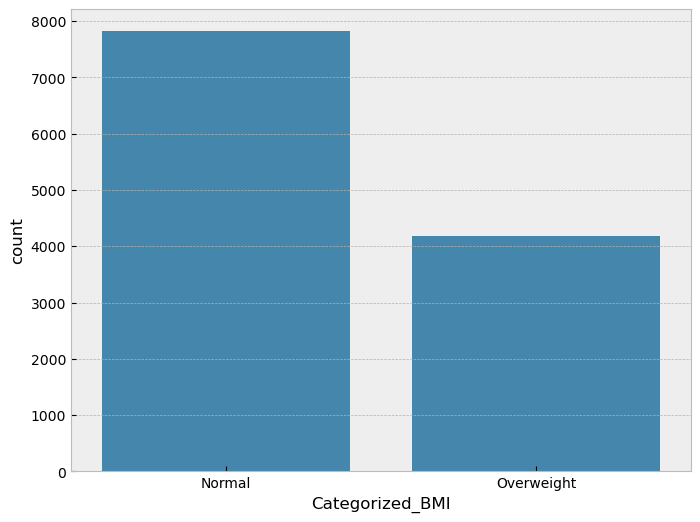

In [42]:
ds = ds[(ds["Categorized_BMI"] == "Normal") | (ds["Categorized_BMI"] == "Overweight")]
plt.rcParams['figure.figsize'] = 8, 6
sns.barplot(data = ds , x = "Categorized_BMI" , y = "count")

In [88]:
ds =exercise_train_data[["Gender" ,"Categorized_BMI"]].value_counts().reset_index().sort_values(by = ["Gender" , "Categorized_BMI"])
ds.columns = ["Gender" , "Categorized_BMI" , "Count"]
ds

,Gender,Categorized_BMI,Count
0,female,Normal,5572
3,female,Overweight,496
2,male,Normal,2247
1,male,Overweight,3685


<Axes: xlabel='Categorized_BMI', ylabel='Count'>

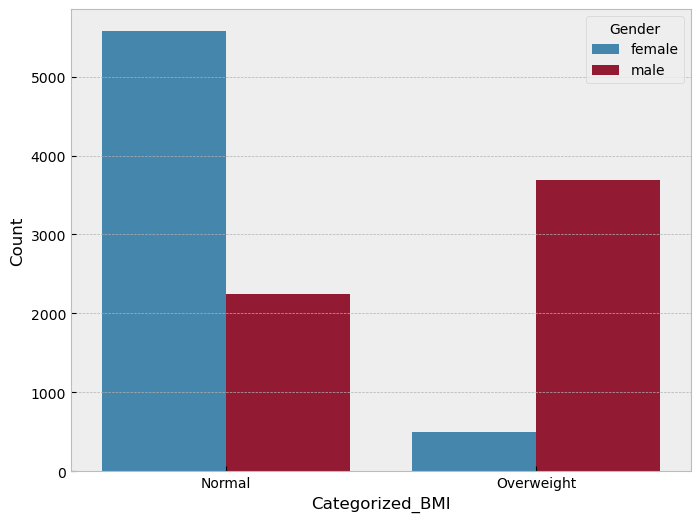

In [90]:
plt.rcParams["figure.figsize"] = 8 , 6
sns.barplot(data = ds , x = "Categorized_BMI" , y = "Count" , hue = "Gender")

In [92]:
ds =exercise_train_data[["age_groups" ,"Categorized_BMI"]].value_counts().reset_index().sort_values(by = ["age_groups" , "Categorized_BMI"])
ds.columns = ["age_groups" , "Categorized_BMI" , "Count"]
ds

,age_groups,Categorized_BMI,Count
0,Young,Normal,4369
2,Young,Overweight,1660
1,Middle-Aged,Normal,2197
3,Middle-Aged,Overweight,1338
4,Old,Normal,1253
5,Old,Overweight,1183


* As we can see the `Categorized_BMI` is identically distributed between age groups(the sequence is identical, for example in both `Normal` and `Overweight` ; `Young` comes first , 'Middle-Aged` comes second , etc.)

* An interesting thing is , about `50%` of old individuals have `Normal` weight and another `50%` are `Overweight`. 

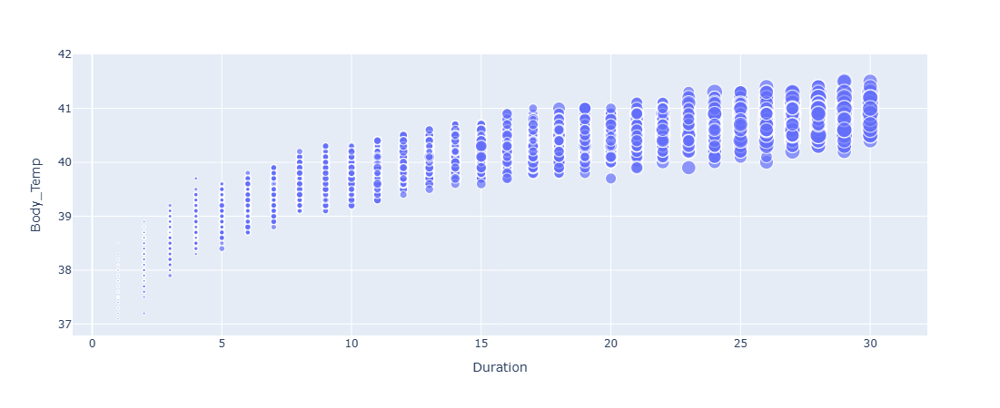

In [95]:
fig = px.scatter(exercise_train_data , x = "Duration" , y = "Body_Temp" , size = "Calories")

fig.update_layout(      
    width=700,
    height=450,
)

fig.show()

### Corelation
In this section we are going to analyze the correlations between each two features.The corrlation helps us to see , how much this two features' relationship is strong.If the the relationship of this two features is extremely strong(In other words the correlation is equall to 1 or -1 or close to this two numbers) we will face `collinearity` problem in our model.This means that not only this two feature will not help us to build a better model but also they cause some problems for our model.One way is to remove one of these feaures.


* We use pearson correlation method:



###### Covariance : **COV(X , Y)** = $$( \frac{\sum (X_{i} - \bar{X})(Y_{i} - \bar{Y})}{N}  )$$


###### Correlation : **CORR(X , Y)** = $$( \frac {COV(X , Y)}{\sigma_{X} \sigma_{Y}}  )$$

**Where** :

> 1. **Xi** : the values of the X-variable

> 2. **Yj** :  the values of the Y-variable

> 3. **X̄**  : the mean (average) of the X-variable

> 4. **Ȳ**  : the mean (average) of the Y-variable

> 5. **N**  : the number of data points

> 6. **σX** : the standard deviation of the X-variable

> 7. **σY** : the standard deviation of the Y-variable


So now lets plot the heatmap to analyze the correlation of features in this dataset.

In [102]:
exercise_train_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'Duration', 'Heart_Rate',
       'Body_Temp', 'Calories', 'age_groups', 'BMI', 'Categorized_BMI'],
      dtype='object')

<Axes: >

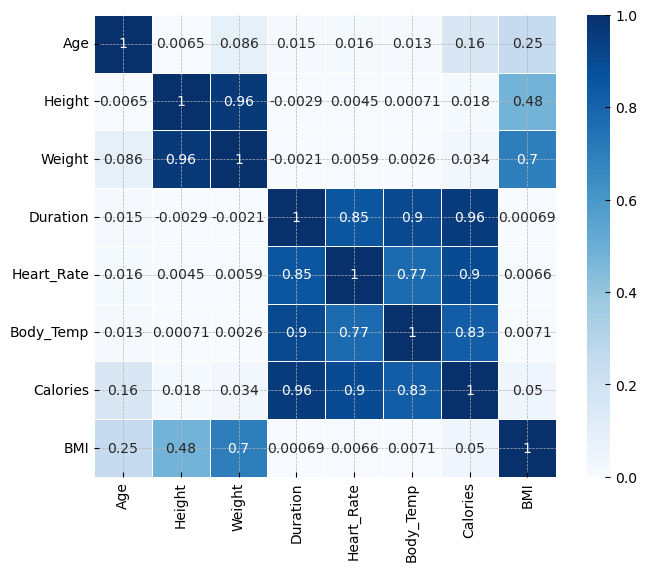

In [104]:
plt.rcParams["figure.figsize"] = 8 , 6
corr = exercise_train_data.corr(numeric_only = True)
sns.heatmap(corr , annot = True , square = True , linewidth = .5 , vmin = 0 , vmax = 1 , cmap = 'Blues')

* This heatmap shows the correlation of both features in each cell.As we can see, many features have high correlation with another feature.One thing that has to be mentioned is that we have to drop useless features as many as possible.Because when we have many features the dimension of fearture space will be very large and when our model runs on this features it will be very slow.Because of that we have to drop some features.
* If two or more features have a high correlation with each other, we have to save one of them and drop the rest.In This way, we can improve model's efficiency.
* According to the heatmap, `Weight` and `Height` have a high correlation but we combined them and put them into the `BMI` column.So we can drop `Weight` and `Height` columns and save `BMI`.


Before we feed our data to the model we have to first convert `categorical` column(like `Gender`) into `numerical` column.

In [108]:
exercise_train_data = exercise_train_data[["Gender" , "Age" , "BMI" , "Duration" , "Heart_Rate" , "Body_Temp" , "Calories"]]
exercise_test_data = exercise_test_data[["Gender" , "Age" , "BMI"  , "Duration" , "Heart_Rate" , "Body_Temp" , "Calories"]]
exercise_train_data = pd.get_dummies(exercise_train_data, drop_first = True)
exercise_test_data = pd.get_dummies(exercise_test_data, drop_first = True)

In [110]:
X_train = exercise_train_data.drop("Calories" , axis = 1)
y_train = exercise_train_data["Calories"]

X_test = exercise_test_data.drop("Calories" , axis = 1)
y_test = exercise_test_data["Calories"]

In [112]:
# print(X_train.shape)
# print(X_test.shape)
# print(y_train.shape)
# print(y_test.shape)

### Learning Curve
Learning Curve is a plot of the model's performance on the training set and the validation set as a function of the training set size(or the training iteration).One of the concepts that we get is the appropriate number of examples in training set size.If we take a look at the plot down below we will see that both training set size and validation set reached a plateau at a certain training set size(for example `800` training set size).It means that, with only `800` training set size we will get similar results with our model in compare to `1000` , `2500` or `5000` training set size.In other word increasing the training set size more than `800` will not improve the model's performance significantly.

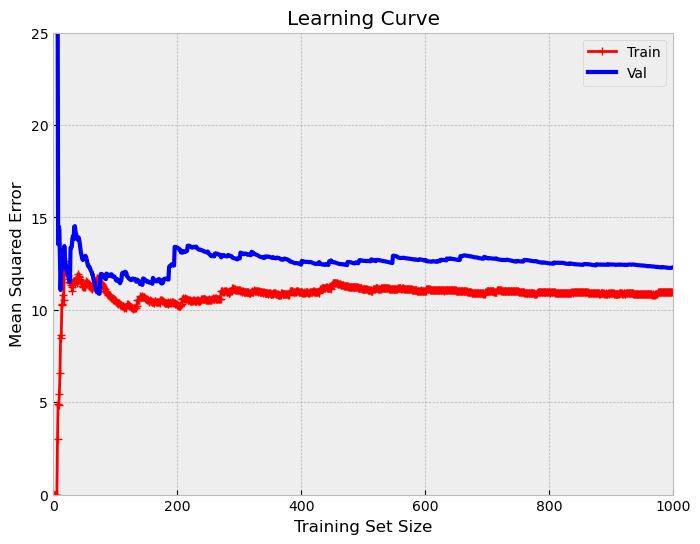

In [115]:
train_errors , val_errors = [] , []
def plot_learning_curve(model):
  for m in range(1 , 1000):
    model.fit(X_train[:m] , y_train[:m])
    y_train_predict = model.predict(X_train[:m])
    y_val_predict = model.predict(X_test[:m])
    train_errors.append(mean_squared_error(y_train[:m] , y_train_predict))
    val_errors.append(mean_squared_error(y_test[:m] , y_val_predict))

  plt.plot(np.sqrt(train_errors) , "r-+" , linewidth = 2 , label = "Train")
  plt.plot(np.sqrt(val_errors) , "b-" , linewidth = 3 , label = "Val")
  plt.title("Learning Curve")
  plt.xlabel("Training Set Size")
  plt.ylabel("Mean Squared Error")
  plt.xlim([0 , 1000])
  plt.ylim([0 , 25])
  plt.legend()
linreg = LinearRegression()
plot_learning_curve(linreg)


* Another reason that the training set and validation set could not reach a lower MSE with more examples is that the dataset do not have enough informative features that our learning algorithm can leverage to build more performant model. 

### Building Regression Model

In [122]:
linreg = LinearRegression()
linreg.fit(X_train , y_train)
linreg_prediction = linreg.predict(X_test)

## Regression Evaluation Metrics


Here are three common evaluation metrics for regression problems:

**Mean Absolute Error** (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

**Mean Squared Error** (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

**Root Mean Squared Error** (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

- **MAE** is the easiest to understand, because it's the average error.

- **MSE** is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.

- **RMSE** is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are **loss functions**, because we want to minimize them.

[Source](https://www.udemy.com/course/python-for-data-science-and-machine-learning-bootcamp/)

In [125]:
print("Linear Regression Mean Absolute Error(MAE) : " , round(metrics.mean_absolute_error(y_test , linreg_prediction) , 2))
print("Linear Regression Mean Squared Error(MSE) : " , round(metrics.mean_squared_error(y_test , linreg_prediction) , 2))
print("Linear Regression Root Mean Squared Error(RMSE) : " , round(np.sqrt(metrics.mean_squared_error(y_test , linreg_prediction)) , 2))

Linear Regression Mean Absolute Error(MAE) :  8.52
Linear Regression Mean Squared Error(MSE) :  140.08
Linear Regression Root Mean Squared Error(RMSE) :  11.84


### RandomForestRegressor Algorithm
* In this section I will be using the `GridSearchCV` on of the cross-validation methods that we use for selecting `hyperparameters`.

* In this section , I will be using 3 hyperparameters for RandomForestRegressor algorithm which is `n_estimators` , `max_features` and `max_depth`.This will run on 5 splits and the split with highest accuracy will be picked.

**NOTE:** Sometimes running `GridSearchCV` is very time consuming in terms of `computational complexity`.So I have already run the GridSearchCV and put the best parameters into `RandomForestRegressor` directly and then run the model.So I commented out `GridSearchCV` and all of its dependencies.

In [128]:
from sklearn.ensemble import RandomForestRegressor

In [130]:
random_reg = RandomForestRegressor(n_estimators = 1000 , max_features = 3 , max_depth = 6)
random_reg.fit(X_train , y_train)
random_reg_prediction = random_reg.predict(X_test)

In [131]:
print("RandomForest Mean Absolute Error(MAE) : " , round(metrics.mean_absolute_error(y_test , random_reg_prediction) , 2))
print("RandomForest Mean Squared Error(MSE) : " , round(metrics.mean_squared_error(y_test , random_reg_prediction) , 2))
print("RandomForest Root Mean Squared Error(RMSE) : " , round(np.sqrt(metrics.mean_squared_error(y_test , random_reg_prediction)) , 2))

RandomForest Mean Absolute Error(MAE) :  5.32
RandomForest Mean Squared Error(MSE) :  69.1
RandomForest Root Mean Squared Error(RMSE) :  8.31


In [134]:
exercise_train_data.iloc[32]

Age               23
BMI            24.88
Duration        27.0
Heart_Rate     102.0
Body_Temp       40.3
Calories         140
Gender_male     True
Name: 5897, dtype: object

In [136]:
X_array = np.array([[24 , 25 , 28 , 100 , 40 , 1]]).reshape(1 , -1)
y_pred = random_reg.predict(X_array)
print("Prediction : " , round(y_pred[0] , 2))

Prediction :  144.34


* As we can see this model did a good job and the predicted value is close to the real value in the dataset.